# Red Wine: Model to predict qualityt

### Import Packages

In [897]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [898]:
!ls

Red_Wine.ipynb
attachment_Projects_for_Machine_Learning_2020_lyst5166.pdf
wine_data.html
winequality-red.csv
winequality.docx


### Load data

In [899]:
# Load red wine dataset
data = pd.read_csv('winequality-red.csv', sep=';')
data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [900]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


All columns has the same number of data points, so it looks like there are no missing data.

### Check Null Values

In [901]:
data.isnull().sum(axis = 1)

0       0
1       0
2       0
3       0
4       0
       ..
1594    0
1595    0
1596    0
1597    0
1598    0
Length: 1599, dtype: int64

In [902]:
data.isnull().sum(axis = 0)

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

### Data Cleaning

#### Pandas profiling

In [903]:
#Perform Pandas profiling to understand quick overview of columns

# import pandas_profiling
# report = pandas_profiling.ProfileReport(data)

#covert profile report as html file
report.to_file("wine_data.html")

In [904]:
from IPython.display import display,HTML,IFrame

display(HTML(open('wine_data.html').read()))

Number of variables,12
Number of observations,1599
Missing cells,0
Missing cells (%),0.0%
Duplicate rows,240
Duplicate rows (%),15.0%
Total size in memory,150.0 KiB
Average record size in memory,96.1 B
NUM,12
Analysis started,2020-06-02 09:01:36.204399
Analysis finished,2020-06-02 09:02:32.968229


###### You can observe null value, missing value, total feature, duplicate value, everything from pandas profiling. We can say that there is no need to induvisual observations.

### Summary statistics

In [905]:
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


### duplicated rows

In [906]:
extra = data[data.duplicated()]
extra.shape

(240, 12)

There are 240 duplicates. But I think it is wise to keep these "extra" as I am assuming that the quality ratings for the same/similar wine were given by different wine tasters.

In [907]:
# Let's proceed to separate 'quality' as the target variable and the rest as features.
y = data.quality                  # set 'quality' as target
X = data.drop('quality', axis=1)  # rest are features
print(y.shape, X.shape)           # check correctness

(1599,) (1599, 11)


### Number of wine quality

In [908]:
y.unique()

array([5, 6, 7, 4, 8, 3])

### Visualize data through plots

#### Hist plot

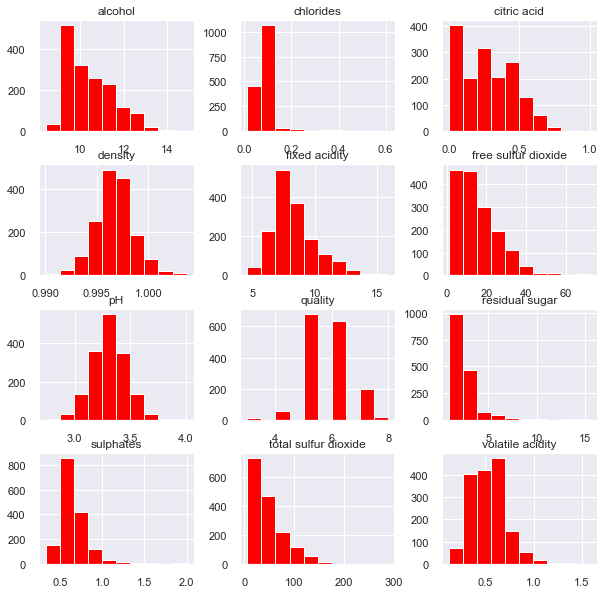

In [909]:
# data.hist(figsize=(10,10))
sns.set()
data.hist(figsize=(10,10), color='red')
plt.show()

#### pairplot plot

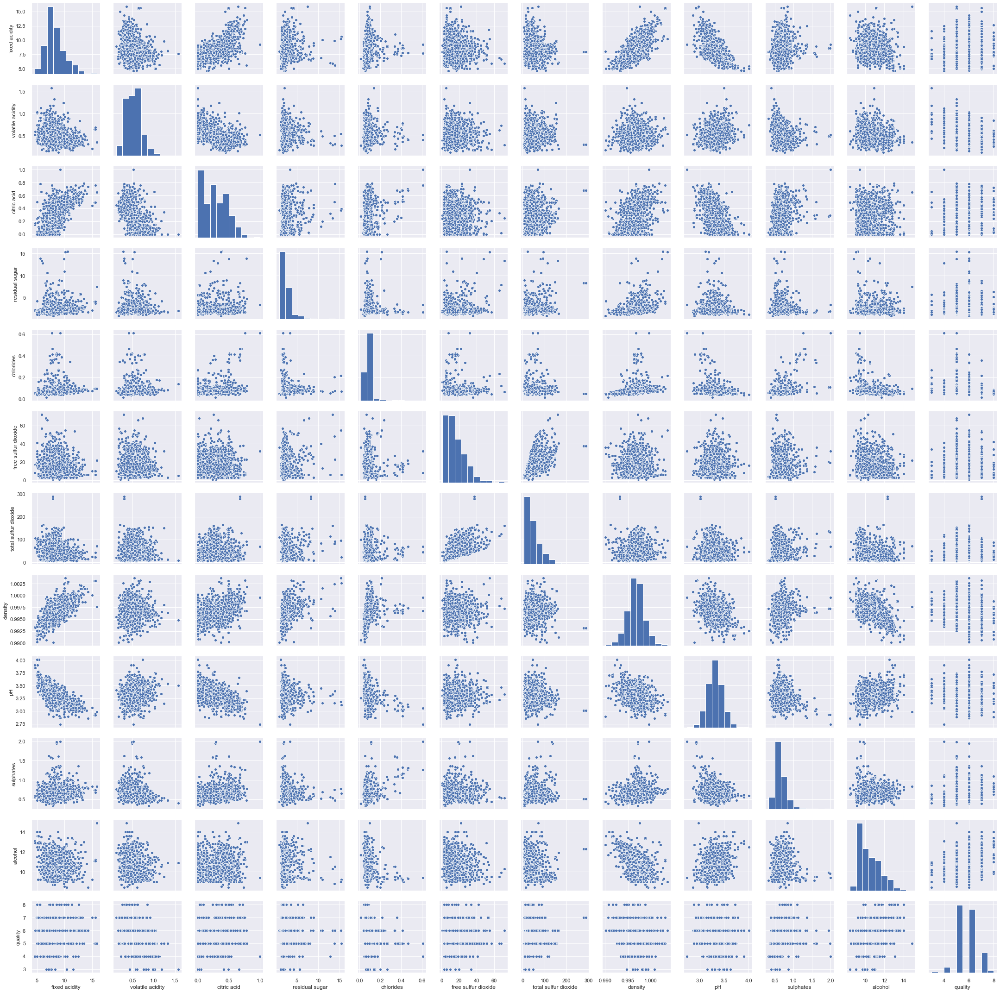

In [910]:
import seaborn as sns
sns.pairplot(data,palette="husl")

#### Correlations heatmap

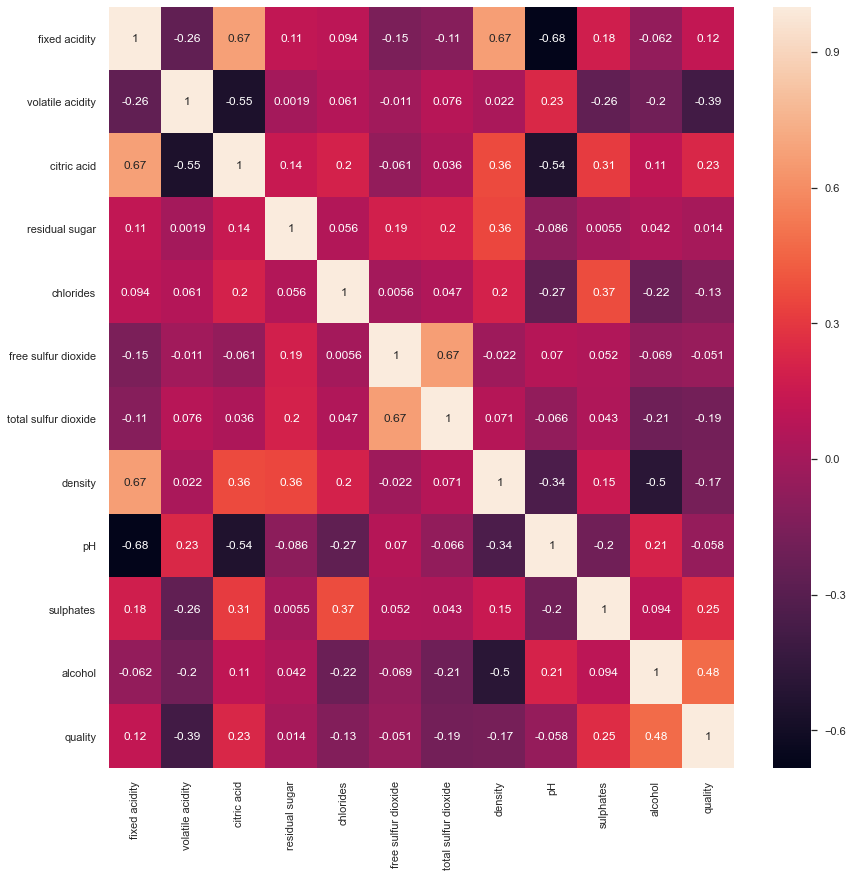

In [911]:
# Plot the correlation matrix

small_corr_matrix = data.corr()

plt.figure(figsize=(14,14))
sns.heatmap(small_corr_matrix, annot=True)

###### =>  Alcohol has the highest correlation with wine quality, followed by the various acidity, sulphates, density & chlorides.

#### Box Plot for Outliers

fixed acidity


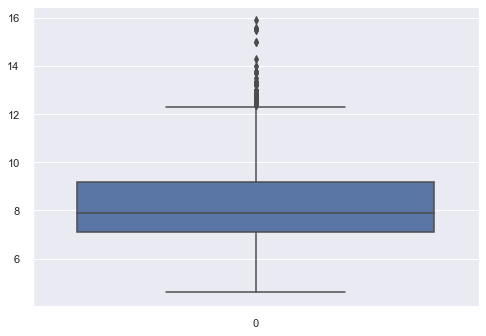

volatile acidity


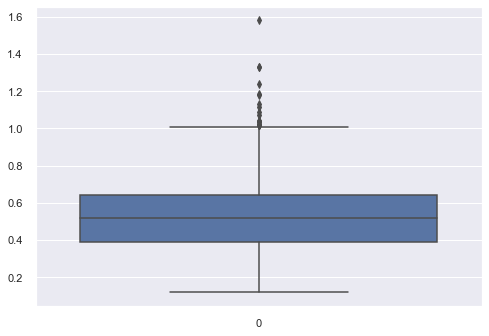

citric acid


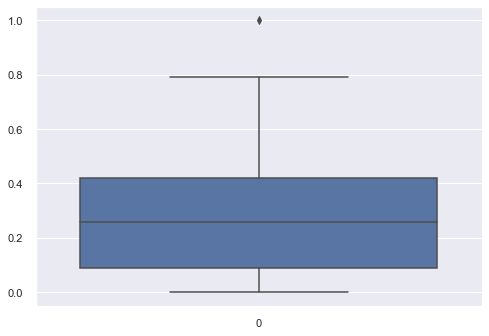

residual sugar


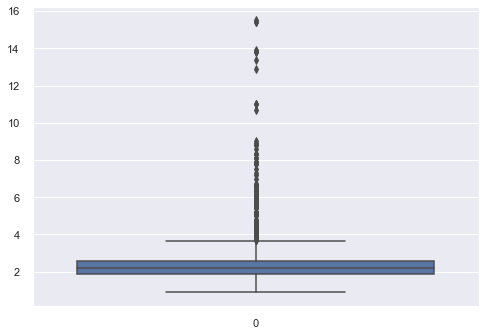

chlorides


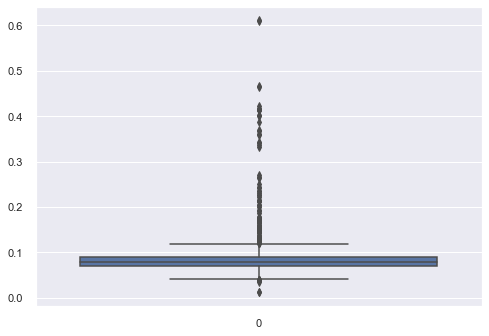

free sulfur dioxide


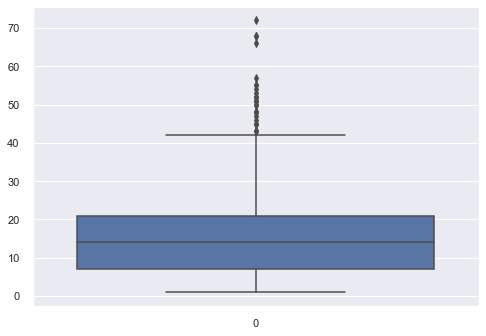

total sulfur dioxide


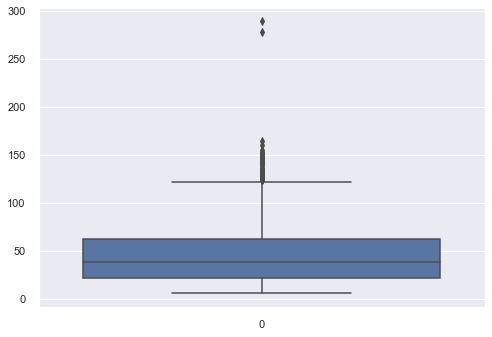

density


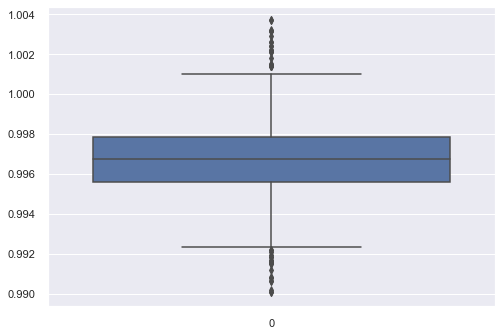

pH


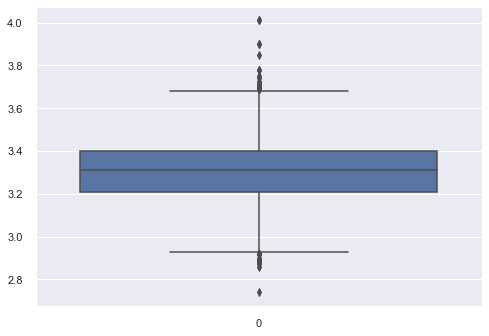

sulphates


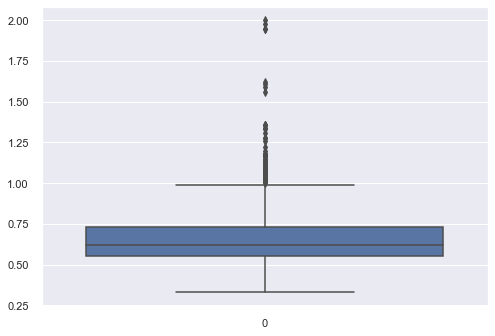

alcohol


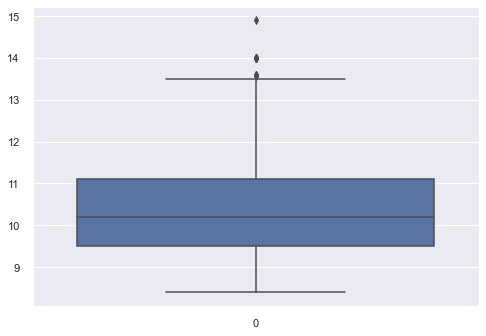

In [912]:
boxplo_list = X.columns
for column in X:
    print(column)
    sns.boxplot(data=data[column])
    plt.show()

#### alchola Vs Quality

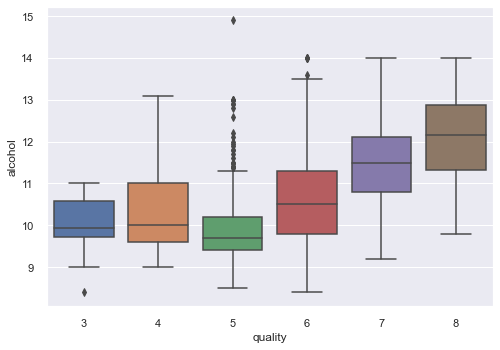

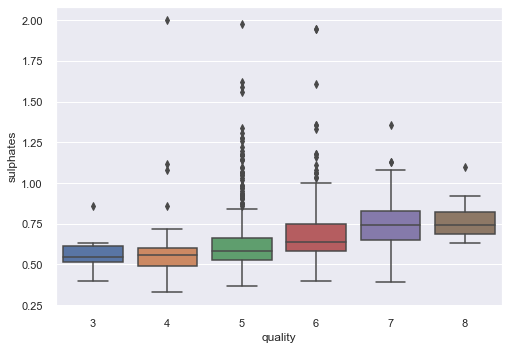

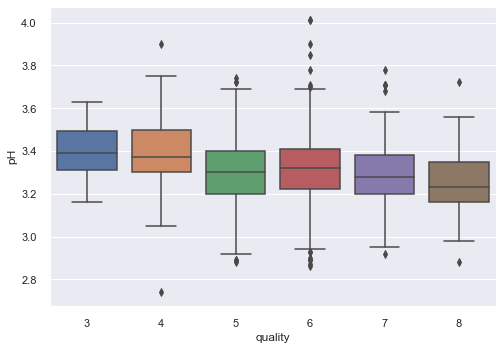

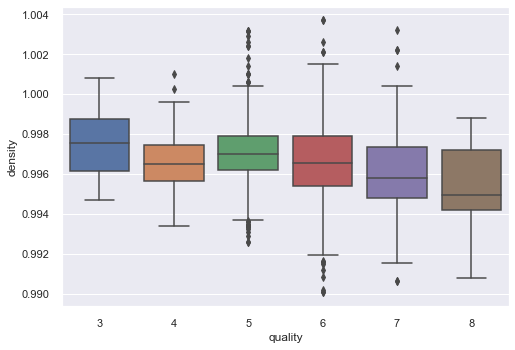

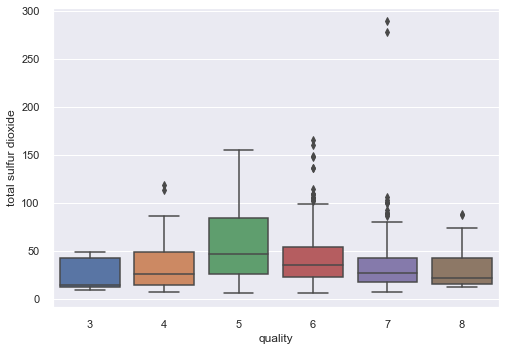

...

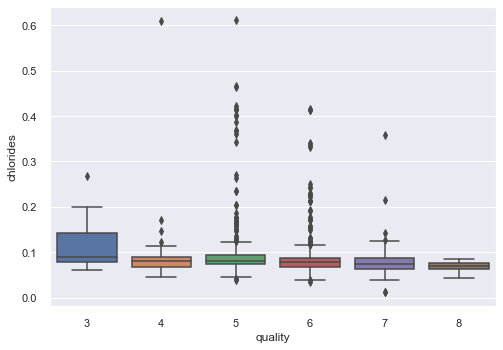

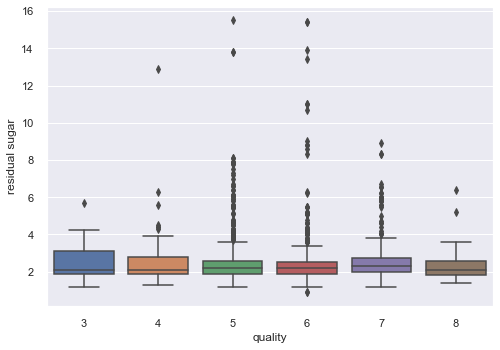

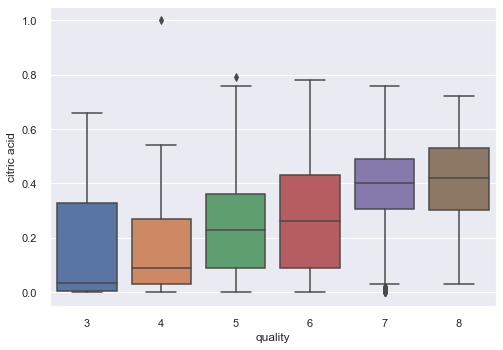

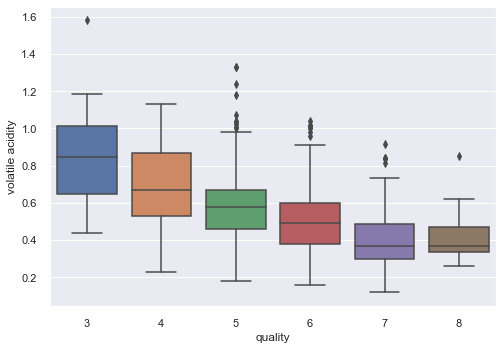

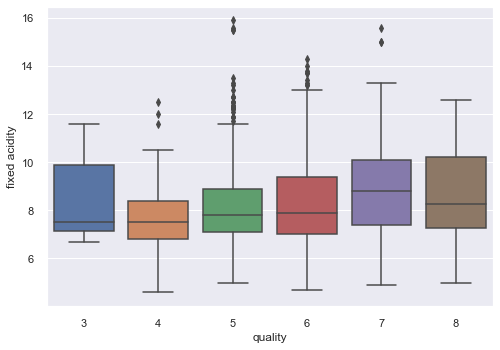

In [913]:
sns.boxplot(x="quality", y="alcohol", data=data)
plt.show()
sns.boxplot(x="quality", y="sulphates", data=data)
plt.show()
sns.boxplot(x="quality", y="pH", data=data)
plt.show()
sns.boxplot(x="quality", y="density", data=data)
plt.show()
sns.boxplot(x="quality", y="total sulfur dioxide", data=data)
plt.show()
sns.boxplot(x="quality", y="free sulfur dioxide", data=data)
plt.show()
sns.boxplot(x="quality", y="chlorides", data=data)
plt.show()
sns.boxplot(x="quality", y="residual sugar", data=data)
plt.show()
sns.boxplot(x="quality", y="citric acid", data=data)
plt.show()
sns.boxplot(x="quality", y="volatile acidity", data=data)
plt.show()
sns.boxplot(x="quality", y="fixed acidity", data=data)
plt.show()

#### Number of Quality graph

In [914]:
quality_type_count = pd.value_counts(data['quality'])

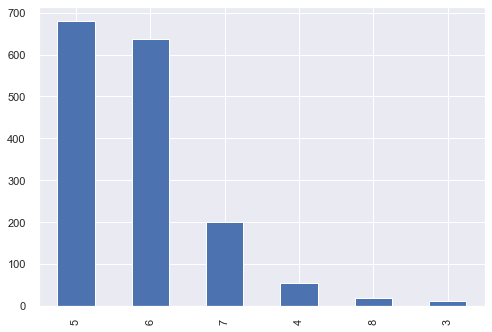

In [915]:
quality_type_count.plot(kind='bar')
plt.show()

### correlation matrix

In [916]:
# Lets plot the correlation matrix 

corr_matrix = data.corr()
corr_matrix

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,-0.256131,0.671703,0.114777,0.093705,-0.153794,-0.113181,0.668047,-0.682978,0.183006,-0.061668,0.124052
volatile acidity,-0.256131,1.000000,-0.552496,0.001918,0.061298,-0.010504,0.076470,0.022026,0.234937,-0.260987,-0.202288,-0.390558
citric acid,0.671703,-0.552496,1.000000,0.143577,0.203823,-0.060978,0.035533,0.364947,-0.541904,0.312770,0.109903,0.226373
residual sugar,0.114777,0.001918,0.143577,1.000000,0.055610,0.187049,0.203028,0.355283,-0.085652,0.005527,0.042075,0.013732
chlorides,0.093705,0.061298,0.203823,0.055610,1.000000,0.005562,0.047400,0.200632,-0.265026,0.371260,-0.221141,-0.128907
free sulfur dioxide,-0.153794,-0.010504,-0.060978,0.187049,0.005562,1.000000,0.667666,-0.021946,0.070377,0.051658,-0.069408,-0.050656
total sulfur dioxide,-0.113181,0.076470,0.035533,0.203028,0.047400,0.667666,1.000000,0.071269,-0.066495,0.042947,-0.205654,-0.185100
density,0.668047,0.022026,0.364947,0.355283,0.200632,-0.021946,0.071269,1.000000,-0.341699,0.148506,-0.496180,-0.174919
pH,-0.682978,0.234937,-0.541904,-0.085652,-0.265026,0.070377,-0.066495,-0.341699,1.000000,-0.196648,0.205633,-0.057731
sulphates,0.183006,-0.260987,0.312770,0.005527,0.371260,0.051658,0.042947,0.148506,-0.196648,1.000000,0.093595,0.251397


### Lets look at some strong correlations.

In [917]:
col_names = data.columns                # Name of all the columns
col_names

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [918]:
df_corr = pd.DataFrame([])
df_corr

""


### Feature Selection

#### Feature selection through correlation

In [919]:
# In this block of code we are going to check all the variables with correlation above a certain threshold

corr_threshold = 0.67                                                 # This is a correlation threshold. We need to find variables with greater threshold

print("---------------CHECKING FOR CORRELATION------------")
for c in col_names:
    for r in col_names:
        if (r < c):
            if (c is not 'quality') and (r is not 'quality') :
                if abs(corr_matrix[r][c]) > corr_threshold:
                    a_row = pd.Series([c, r, str(corr_matrix[r][c])])
                    row_df = pd.DataFrame([a_row])
                    df_corr = pd.concat([df_corr,row_df], ignore_index=True)
                    print(c +" : "+ r+" : "+ str(corr_matrix[r][c]))
print(df_corr)                    

---------------CHECKING FOR CORRELATION------------
fixed acidity : citric acid : 0.6717034347641041
pH : fixed acidity : -0.6829781945685299
               0              1                    2
0  fixed acidity    citric acid   0.6717034347641041
1             pH  fixed acidity  -0.6829781945685299


In [920]:
# Get the unique values of '0' column 
uniqueArray = df_corr[0].unique() 

In [921]:
# GroupBy first column and make list
lists = df_corr.groupby(0)[1].apply(list)
print(lists)

0
fixed acidity      [citric acid]
pH               [fixed acidity]
Name: 1, dtype: object


In [922]:
# Function for make removeble features' list
def removedFeatures(uniqueArray,lists):
    removedFeature = list()
    for outerFeature in uniqueArray:
        for innerFeature in lists[outerFeature]:
            if not(innerFeature in uniqueArray):
                removedFeature.append(innerFeature)
    return removedFeature  

In [923]:
# Call removedFeatures function for get list
listOfRemoveFeatures = removedFeatures(uniqueArray,lists)
print(listOfRemoveFeatures)

['citric acid']


###### => You can see observations in correlation heatmap but you don't then you can observ via this code directly that how many featurse are strongly corelated.

#### Feature selection through ExtraTreesClassifier

[0.07685443 0.09270163 0.07742556 0.07768757 0.07531448 0.07165638
 0.10651359 0.08722136 0.07383036 0.11540857 0.14538607]


/opt/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


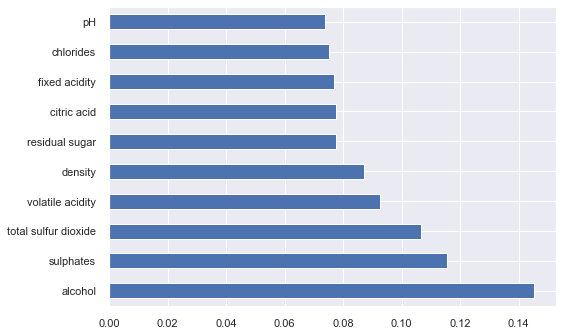

In [924]:
import pandas as pd
import numpy as np
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

### Group the wine into two groups; with 'quality' > 5 as "good wine"

In [925]:
# Create a new y1
y1 = (y > 5).astype(int)
y1.head()

0    0
1    0
2    0
3    1
4    0
Name: quality, dtype: int64

Text(0.5, 0, 'Aggregated target value')

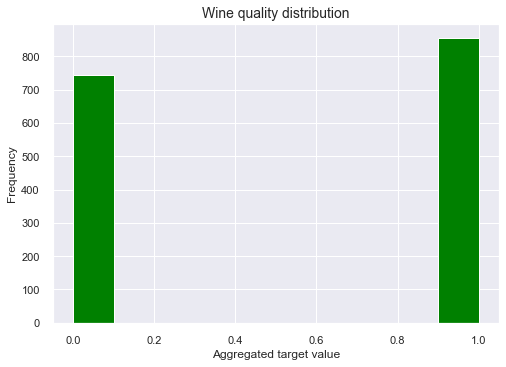

In [926]:
# Plot histogram
ax = y1.plot.hist(color='green')
ax.set_title('Wine quality distribution', fontsize=14)
ax.set_xlabel('Aggregated target value')

### Removed irrelevant features

In [927]:
print(X.shape)                                 # The number of rows and columns in the features
X= X.drop(listOfRemoveFeatures,axis=1)       # Remove all strong correlated features
print(X.shape)                                # The number of rows and columns in the features
# print(X.info())            
print(y1.shape)   # y is the target

(1599, 11)
(1599, 10)
(1599,)


### Standardization & Normalization

In [928]:
# #Standardize rows into uniform scale

# from sklearn.preprocessing import StandardScaler
# scaler = StandardScaler()
# scaler.fit(X)

# # Scale and center the data
# fdf_normalized = scaler.transform(X)

# # Create a pandas DataFrame
# fdf_normalized = pd.DataFrame(data=X, index=X.index, columns=X.columns)

# # Normalization
# from sklearn.preprocessing import MinMaxScaler
# fdf_normalized = MinMaxScaler().fit_transform(X)
# fdf_normalized

### Function for All models

In [929]:
# Lets create our train and validation split

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y1, test_size=0.2, random_state=101)

In [930]:
# metrics

from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, recall_score

In [931]:
def model_train(model, name):
    model.fit(X_train, y_train)                                          # Fitting the model
    y_pred = model.predict(X_test)                                       # Making prediction from the trained model
    cm = confusion_matrix(y_test, y_pred)                               
    print("Grid Search Confusion Matrix " +" Validation Data")                # Displaying the Confusion Matrix
    print(cm)
    print('-----------------------')
    print('-----------------------')
    cr = classification_report(y_test, y_pred)
    print(name +" Classification Report " +" Validation Data")           # Displaying the Classification Report
    print(cr)
    print('------------------------')
    print(name +" AUC Score " +" Validation Data")
    auc = roc_auc_score(y_test, y_pred)       
    print("AUC Score " + str(auc))                                       # Displaying the AUC score
    print(name +" Recall " +" Validation Data")
    rec = recall_score(y_test, y_pred)
    print("Recall "+ str(rec))                                           # Displaying the Recall score
    print('_________________________')
    print(name + " Bias")                                                 # Calculating bias
    bias = y_pred - y_test.mean()
    print("Bias "+ str(bias.mean()))
    
    print(name + " Variance")                                             # Calculate Variance
    var = np.var([y_test, y_pred], axis=0)
    print("Variance " + str(var.mean()) )
    return auc, rec, model

# Model Building

## Logistic Regression

In [932]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(random_state=101)

In [933]:
lr_auc, lr_rec, lr_model = model_train(lr, "Logistic Regression")

Grid Search Confusion Matrix  Validation Data
[[108  48]
 [ 37 127]]
-----------------------
-----------------------
Logistic Regression Classification Report  Validation Data
              precision    recall  f1-score   support

           0       0.74      0.69      0.72       156
           1       0.73      0.77      0.75       164

    accuracy                           0.73       320
   macro avg       0.74      0.73      0.73       320
weighted avg       0.74      0.73      0.73       320

------------------------
Logistic Regression AUC Score  Validation Data
AUC Score 0.7333489681050657
Logistic Regression Recall  Validation Data
Recall 0.774390243902439
_________________________
Logistic Regression Bias
Bias 0.03437500000000004
Logistic Regression Variance
Variance 0.06640625


/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


## Decision Tree

In [934]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(criterion = 'gini',max_depth = 10, min_samples_leaf =3, random_state=101)

In [935]:
dt_auc, dt_rec, dt_model = model_train(dt, "Decision Tree")

Grid Search Confusion Matrix  Validation Data
[[ 99  57]
 [ 36 128]]
-----------------------
-----------------------
Decision Tree Classification Report  Validation Data
              precision    recall  f1-score   support

           0       0.73      0.63      0.68       156
           1       0.69      0.78      0.73       164

    accuracy                           0.71       320
   macro avg       0.71      0.71      0.71       320
weighted avg       0.71      0.71      0.71       320

------------------------
Decision Tree AUC Score  Validation Data
AUC Score 0.7075515947467167
Decision Tree Recall  Validation Data
Recall 0.7804878048780488
_________________________
Decision Tree Bias
Bias 0.06562500000000003
Decision Tree Variance
Variance 0.07265625


## Random Forest Algorithm

In [936]:
# Random Forest Algorithm

from sklearn.ensemble import RandomForestClassifier
rf_clf = RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=40, max_features='sqrt', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=18,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [937]:
rf_auc, rf_rec, rf_model = model_train(rf_clf, "Random Forest Classifier")

Grid Search Confusion Matrix  Validation Data
[[116  40]
 [ 26 138]]
-----------------------
-----------------------
Random Forest Classifier Classification Report  Validation Data
              precision    recall  f1-score   support

           0       0.82      0.74      0.78       156
           1       0.78      0.84      0.81       164

    accuracy                           0.79       320
   macro avg       0.80      0.79      0.79       320
weighted avg       0.80      0.79      0.79       320

------------------------
Random Forest Classifier AUC Score  Validation Data
AUC Score 0.7925265791119449
Random Forest Classifier Recall  Validation Data
Recall 0.8414634146341463
_________________________
Random Forest Classifier Bias
Bias 0.04375000000000004
Random Forest Classifier Variance
Variance 0.0515625


In decision tree there are multiple FN values and Random Forest is overfitted, so we will go forward through logistic regresion and try to decrease FN values.

## Random Forest Algorithm

In [938]:
# Random Forest Algorithm

from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=40, max_features='sqrt', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=18,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)                           

model.fit(X_train, y_train)                                          # Fitting the model
y_pred = model.predict(X_test)                                       # Making prediction from the trained model
y_pred_train = model.predict(X_train)                               # Making prediction from the trained model

### Accuracy of the model

In [939]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, recall_score
# comparing the metrics of predicted lebel and real label of test data
print("Test Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Test Accuracy:  0.7875


In [940]:
# comparing the metrics of predicted lebel and real label of test data
print("Train Accuracy: ", metrics.accuracy_score(y_train, y_pred_train))

Train Accuracy:  0.9827990617670055


### Null Accuracy

In [941]:
# Actual Values of y_test
y_test.value_counts()
y_test.value_counts().head(1) / len(y_test)

1    0.5125
Name: quality, dtype: float64

### Confusion Matrix

In [942]:
cm = confusion_matrix(y_test, y_pred) 
cm

array([[116,  40],
       [ 28, 136]])

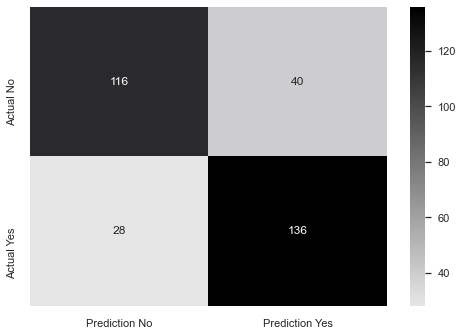

In [943]:
cmap = sns.cubehelix_palette(50, hue=0.05, rot=0, light=0.9, dark=0, as_cmap=True)
sns.heatmap(cm,cmap = cmap,xticklabels=['Prediction No','Prediction Yes'],yticklabels=['Actual No','Actual Yes'], annot=True,
            fmt='d')

### Classification Report

In [944]:
# Creating Classification Report

cr = metrics.classification_report(y_test, y_pred)
print(cr)

              precision    recall  f1-score   support

           0       0.81      0.74      0.77       156
           1       0.77      0.83      0.80       164

    accuracy                           0.79       320
   macro avg       0.79      0.79      0.79       320
weighted avg       0.79      0.79      0.79       320



### ROC Curve

In [945]:
y_predict_probabilities = model.predict_proba(X_test)
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict_probabilities[:,1])

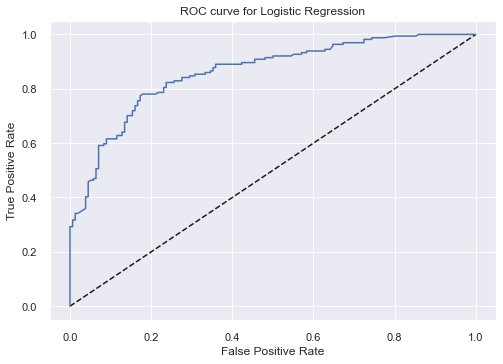

In [946]:
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr,label='Logistic Regression')
plt.title('ROC curve for Logistic Regression')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

### AUC score (Area Under Curve)

In [947]:
auc = roc_auc_score(y_test, y_pred)       
print("AUC Score " + str(auc))

AUC Score 0.7864290181363351


## Grid Search

In [948]:
from sklearn.model_selection import GridSearchCV

random_grid = {'n_estimators': range(5,20),
              'max_features' : ['auto', 'sqrt'],
              'max_depth' : [10,20,30,40],
              'min_samples_split':[2,5,10],
              'min_samples_leaf':[1,2,4]}

rf = RandomForestClassifier()

rf_gs = GridSearchCV(rf, random_grid, cv = 3, n_jobs=-1, verbose=2)

rf_gs.fit(X_train, y_train)
y_pred = rf_gs.predict(X_test)

Fitting 3 folds for each of 1080 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 248 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done 654 tasks      | elapsed:   18.3s
[Parallel(n_jobs=-1)]: Done 1220 tasks      | elapsed:   33.0s
[Parallel(n_jobs=-1)]: Done 1950 tasks      | elapsed:   49.9s
[Parallel(n_jobs=-1)]: Done 2840 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:  1.3min finished


In [949]:
rf_gs.best_estimator_

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=20, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=17,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

## Model Explainations

### Permutation Importance

We will run the permutation importance using Decision Tree Classifier

In [950]:
import eli5

from eli5.sklearn import PermutationImportance

perm = PermutationImportance(dt_model, random_state=101).fit(X_test, y_test)      # Evaluate the permutation importance 
eli5.show_weights(perm, feature_names = X_test.columns.values)                    # Display the weights of each features

Weight,Feature
0.1037 ± 0.0254,alcohol
0.0419 ± 0.0116,sulphates
0.0419 ± 0.0085,volatile acidity
0.0256 ± 0.0228,total sulfur dioxide
0.0175 ± 0.0300,pH
0.0125 ± 0.0288,chlorides
0.0112 ± 0.0085,free sulfur dioxide
0.0056 ± 0.0115,residual sugar
0.0037 ± 0.0160,density
-0.0038 ± 0.0150,fixed acidity


Lets check the same with Random Forest classifier

In [951]:
perm = PermutationImportance(rf_model, random_state=101).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.values)

Weight,Feature
0.1181 ± 0.0222,alcohol
0.0800 ± 0.0170,sulphates
0.0387 ± 0.0318,total sulfur dioxide
0.0331 ± 0.0364,volatile acidity
0.0294 ± 0.0222,density
0.0231 ± 0.0255,residual sugar
0.0181 ± 0.0108,pH
0.0162 ± 0.0238,chlorides
0.0087 ± 0.0232,fixed acidity
-0.0025 ± 0.0139,free sulfur dioxide


Conclusion: The columns in the green are the most important features.

### Shap

Lets see how the columns impact a single record of data

In [952]:
row_to_show = 7                                                                # The row for which we want to check the SHAP explanations
data_to_predict = X_test.iloc[row_to_show]
#data_to_predict

In [953]:
data_to_preddict_array = data_to_predict.values.reshape(1,-1)

dt_model.predict_proba(data_to_preddict_array)                                 # Prediction probability on the row of the data

array([[0., 1.]])

In [954]:
dt_model.predict(data_to_preddict_array)                                       # Predicted output

array([1])

In [955]:
y_test.iloc[row_to_show]

1

In [956]:
import shap

# Object that can calculate Shap values
explainer = shap.TreeExplainer(dt_model)                                       # SHAP Tree Explainer

# Calculate the shap values
shap_values = explainer.shap_values(data_to_predict)                           # SHAP explanations

In [957]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], data_to_predict)

### LIME

In [958]:
pip install lime

Note: you may need to restart the kernel to use updated packages.


In [959]:
import lime
import lime.lime_tabular

In [960]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                         feature_names=X_train.columns.values.tolist(),
                                                         mode='classification',class_names='Attack')

In [961]:
lime_expln1=explainer.explain_instance(X_test.iloc[1],dt_model.predict_proba,num_features=X_test.shape[1], top_labels = 1)
lime_expln1.show_in_notebook(show_table=True, show_all=False)